In [ ]:
import numpy as np
import pandas as pd

import os
import cv2
import glob
import json

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings(action='ignore')

from datetime import datetime
from datetime import time

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Making lists of dataset files

In [ ]:
train_jsons = sorted(glob.glob('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_labeling/*.json'))

## Loading training meta data (json)

In [ ]:
train_meta = []
for j in train_jsons:
    json_obj = json.load(open(j), encoding="utf-8")
    # json_obj['features']
    for f in json_obj['features']:
        # geometry
        geo_coord = f['geometry']['coordinates']
        geo_type = f['geometry']['type']
        # properties
        object_imcoords = f['properties']['object_imcoords']
        building_imcoords = f['properties']['building_imcoords']
        road_imcoords = f['properties']['road_imcoords'] 
        image_id = f['properties']['image_id'] # 영상 ID
        ingest_time = f['properties']['ingest_time'] # 	영상 생성 시간
        type_id = f['properties']['type_id'] # 정수 (1~N), 클래스 id
        type_name = f['properties']['type_name'] # 클래스 이름

        # add to list
        train_meta.append([image_id, type_id, type_name, geo_coord, geo_type,
                           object_imcoords, building_imcoords, road_imcoords, ingest_time])
# Make dataframe
df_train = pd.DataFrame(train_meta,
                        columns = ['image_id','type_id','type_name','geo_coord','geo_type',
                                   'object_imcoords','building_imcoords','road_imcoords','ingest_time'])

In [ ]:
df_train.to_csv('/content/drive/MyDrive/Colab Notebooks/road_train.csv', mode='w')

In [ ]:
df_train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/road_train.csv')

In [ ]:
df_train.head(5)

,Unnamed: 0,image_id,type_id,type_name,geo_coord,geo_type,object_imcoords,building_imcoords,road_imcoords,ingest_time
0,0,BLD00001_PS3_K3A_NIA0276.png,2,Primary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"1024,925.5097910406106,992.6393195670636,1024,...",2020-11-05T06:40:40.855682Z
1,1,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"1010.2380691168404,1024,1019.50630828305,997.5...",2020-11-05T06:40:40.855682Z
2,2,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"1024,814.3786902661797,1005.3761647859196,841....",2020-11-05T06:40:40.855682Z
3,3,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"880.4023489084318,1024,863.8588407181591,1003....",2020-11-05T06:40:40.855682Z
4,4,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"910.4217604521727,916.6282499471876,902.112551...",2020-11-05T06:40:40.855682Z


- object, buildings imcoords값 = EMPTY

In [ ]:
df_train.shape

(23387, 10)

In [ ]:
# 인덱스 확인
df_train.index

RangeIndex(start=0, stop=23387, step=1)

In [ ]:
# columns 확인
df_train.columns

Index(['Unnamed: 0', 'image_id', 'type_id', 'type_name', 'geo_coord',
       'geo_type', 'object_imcoords', 'building_imcoords', 'road_imcoords',
       'ingest_time'],
      dtype='object')

In [ ]:
# class 확인
df_train['type_name'].unique()

array(['Primary', 'Tertiary', 'Residential', 'Unclassified', 'Mortorway',
       'Secondary', nan], dtype=object)

-  class 중에 nan이 있음

In [ ]:
df_train[df_train.type_name.isnull()]

,Unnamed: 0,image_id,type_id,type_name,geo_coord,geo_type,object_imcoords,building_imcoords,road_imcoords,ingest_time
3879,3879,BLD00593_PS3_K3A_NIA0277.png,7,NaN,"[[31.3434111073, 30.1401523984, 0.0], [31.3492...",Polygon,EMPTY,EMPTY,"12.0217315917235,329.21049589642814,0,328.6556...",2020-11-20T02:39:29.199656Z


In [ ]:
# 해당 이미지 파일 확인
from IPython.display import Image
Image('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/BLD00593_PS3_K3A_NIA0277.png')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# 해당 행 삭제
df_train = df_train.drop(3879, axis=0)

In [ ]:
# class 개수 확인
df_train['type_name'].unique()

array(['Primary', 'Tertiary', 'Residential', 'Unclassified', 'Mortorway',
       'Secondary'], dtype=object)

In [ ]:
# 각 열의 데이터 타입 확인
df_train.dtypes

Unnamed: 0            int64
image_id             object
type_id               int64
type_name            object
geo_coord            object
geo_type             object
object_imcoords      object
building_imcoords    object
road_imcoords        object
ingest_time          object
dtype: object

In [ ]:
df_train.info

<bound method DataFrame.info of        Unnamed: 0                      image_id  type_id     type_name  \
0               0  BLD00001_PS3_K3A_NIA0276.png        2       Primary   
1               1  BLD00001_PS3_K3A_NIA0276.png        4      Tertiary   
2               2  BLD00001_PS3_K3A_NIA0276.png        4      Tertiary   
3               3  BLD00001_PS3_K3A_NIA0276.png        4      Tertiary   
4               4  BLD00001_PS3_K3A_NIA0276.png        4      Tertiary   
...           ...                           ...      ...           ...   
23382       23382  BLD12311_PS3_K3A_NIA0391.png        6  Unclassified   
23383       23383  BLD12311_PS3_K3A_NIA0391.png        6  Unclassified   
23384       23384  BLD12311_PS3_K3A_NIA0391.png        6  Unclassified   
23385       23385  BLD12311_PS3_K3A_NIA0391.png        5   Residential   
23386       23386  BLD12311_PS3_K3A_NIA0391.png        6  Unclassified   

                                               geo_coord geo_type  \
0      [[3

In [ ]:
# null 값 확인
df_train.isnull().sum()

Unnamed: 0           0
image_id             0
type_id              0
type_name            0
geo_coord            0
geo_type             0
object_imcoords      0
building_imcoords    0
road_imcoords        2
ingest_time          0
dtype: int64

In [ ]:
# roads_imcoords null 데이터 확인
df_train[df_train.road_imcoords.isnull()]

,Unnamed: 0,image_id,type_id,type_name,geo_coord,geo_type,object_imcoords,building_imcoords,road_imcoords,ingest_time
4111,4111,BLD00596_PS3_K3A_NIA0277.png,5,Residential,"[[31.3609468532, 30.140372558, 0.0], [31.36679...",Polygon,EMPTY,EMPTY,NaN,2020-11-11T08:29:37.297611Z
4112,4112,BLD00596_PS3_K3A_NIA0277.png,5,Residential,"[[31.3609468532, 30.140372558, 0.0], [31.36679...",Polygon,EMPTY,EMPTY,NaN,2020-11-11T08:29:37.297611Z


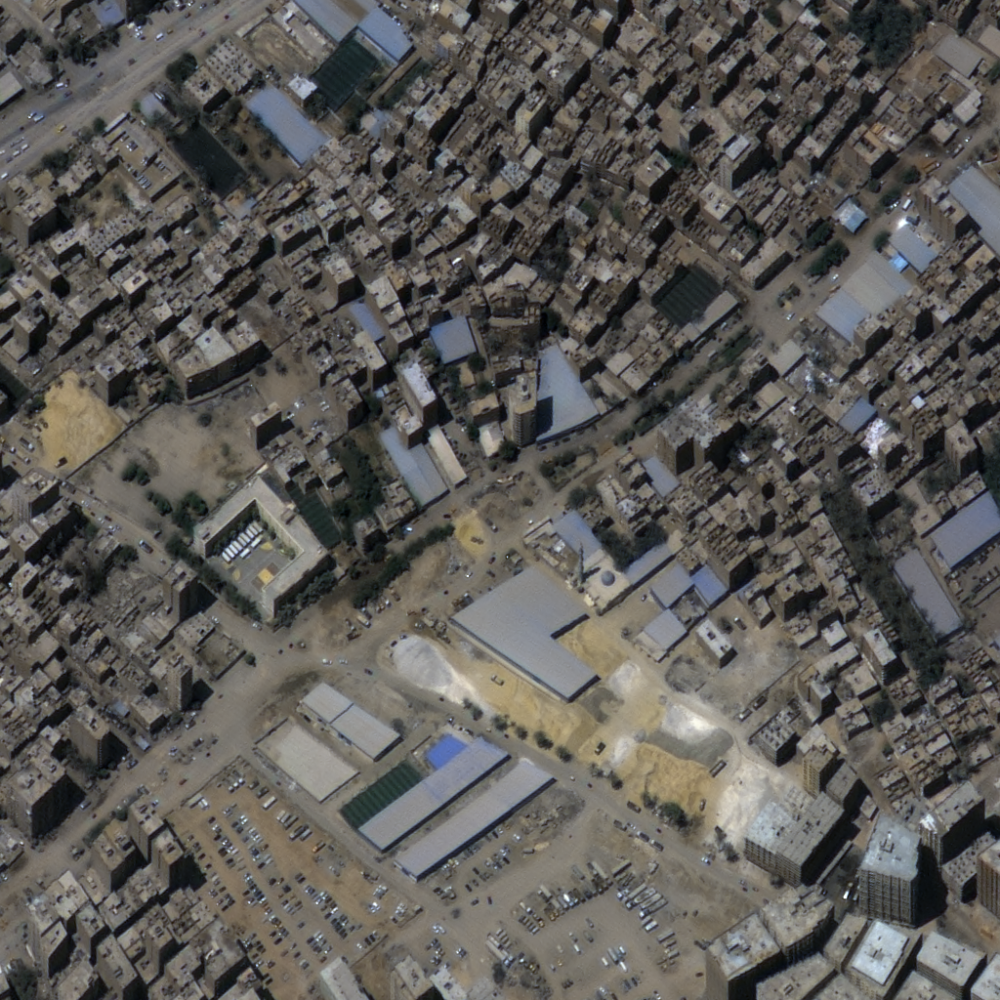

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/BLD00596_PS3_K3A_NIA0277.png')

In [ ]:
# 2개 삭제
df_train = df_train.dropna(axis=0)

In [ ]:
# null 값 확인
df_train.isnull().sum()

Unnamed: 0           0
image_id             0
type_id              0
type_name            0
geo_coord            0
geo_type             0
object_imcoords      0
building_imcoords    0
road_imcoords        0
ingest_time          0
dtype: int64

### ingest_time column을 datatime으로 변환

In [ ]:
df_train['ingest_time']

0        2020-11-05T06:40:40.855682Z
1        2020-11-05T06:40:40.855682Z
2        2020-11-05T06:40:40.855682Z
3        2020-11-05T06:40:40.855682Z
4        2020-11-05T06:40:40.855682Z
                    ...             
23382    2020-10-27T02:05:22.940884Z
23383    2020-10-27T02:05:22.940884Z
23384    2020-10-27T02:05:22.940884Z
23385    2020-10-27T02:05:22.940884Z
23386    2020-10-27T02:05:22.940884Z
Name: ingest_time, Length: 23384, dtype: object

In [ ]:
df_train['ingest_time'].value_counts()

2020-10-27T02:05:22.940884Z    10856
2020-11-25T01:45:39.362580Z     1332
2020-11-18T05:14:02.075623Z      961
2020-11-20T02:39:29.199656Z      668
2020-11-18T05:12:08.586492Z      308
                               ...  
2020-10-19T08:37:46.436629Z        1
2020-10-22T07:53:58.739818Z        1
2020-11-24T08:40:27.246044Z        1
2020-10-16T08:45:53.999372Z        1
2020-10-19T08:50:35.709663Z        1
Name: ingest_time, Length: 413, dtype: int64

In [ ]:
# 날짜 형태로 split
df_train['ingest_date'] = df_train.ingest_time.str.split('T').str[0]
print(df_train['ingest_date'])
print(type(df_train['ingest_date']))

0        2020-11-05
1        2020-11-05
2        2020-11-05
3        2020-11-05
4        2020-11-05
            ...    
23382    2020-10-27
23383    2020-10-27
23384    2020-10-27
23385    2020-10-27
23386    2020-10-27
Name: ingest_date, Length: 23384, dtype: object
<class 'pandas.core.series.Series'>


In [ ]:
# 날짜 시간 형태로 split
df_train['ingest_time'] = df_train.ingest_time.str.split('T').str[1]
df_train['ingest_time'] = df_train['ingest_date'] + ' ' + df_train.ingest_time.str.split('.').str[0]
print(df_train['ingest_time'])

0        2020-11-05 06:40:40
1        2020-11-05 06:40:40
2        2020-11-05 06:40:40
3        2020-11-05 06:40:40
4        2020-11-05 06:40:40
                ...         
23382    2020-10-27 02:05:22
23383    2020-10-27 02:05:22
23384    2020-10-27 02:05:22
23385    2020-10-27 02:05:22
23386    2020-10-27 02:05:22
Name: ingest_time, Length: 23384, dtype: object


In [ ]:
# datatime type으로 변환 - ingest_date
df_train['ingest_date'] = pd.to_datetime(df_train['ingest_date'])
print(df_train['ingest_date'])
print(type(df_train['ingest_date']))

0       2020-11-05
1       2020-11-05
2       2020-11-05
3       2020-11-05
4       2020-11-05
           ...    
23382   2020-10-27
23383   2020-10-27
23384   2020-10-27
23385   2020-10-27
23386   2020-10-27
Name: ingest_date, Length: 23384, dtype: datetime64[ns]
<class 'pandas.core.series.Series'>


In [ ]:
# datatime type으로 변환 - ingest_time
df_train['ingest_time'] = pd.to_datetime(df_train['ingest_time'])
print(df_train['ingest_time'])
print(type(df_train['ingest_time']))

0       2020-11-05 06:40:40
1       2020-11-05 06:40:40
2       2020-11-05 06:40:40
3       2020-11-05 06:40:40
4       2020-11-05 06:40:40
                ...        
23382   2020-10-27 02:05:22
23383   2020-10-27 02:05:22
23384   2020-10-27 02:05:22
23385   2020-10-27 02:05:22
23386   2020-10-27 02:05:22
Name: ingest_time, Length: 23384, dtype: datetime64[ns]
<class 'pandas.core.series.Series'>


In [ ]:
df_train.dtypes

Unnamed: 0                    int64
image_id                     object
type_id                       int64
type_name                    object
geo_coord                    object
geo_type                     object
object_imcoords              object
building_imcoords            object
road_imcoords                object
ingest_time          datetime64[ns]
ingest_date          datetime64[ns]
dtype: object

In [ ]:
df_train

,Unnamed: 0,image_id,type_id,type_name,geo_coord,geo_type,object_imcoords,building_imcoords,road_imcoords,ingest_time,ingest_date
0,0,BLD00001_PS3_K3A_NIA0276.png,2,Primary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"1024,925.5097910406106,992.6393195670636,1024,...",2020-11-05 06:40:40,2020-11-05
1,1,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"1010.2380691168404,1024,1019.50630828305,997.5...",2020-11-05 06:40:40,2020-11-05
2,2,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"1024,814.3786902661797,1005.3761647859196,841....",2020-11-05 06:40:40,2020-11-05
3,3,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"880.4023489084318,1024,863.8588407181591,1003....",2020-11-05 06:40:40,2020-11-05
4,4,BLD00001_PS3_K3A_NIA0276.png,4,Tertiary,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Polygon,EMPTY,EMPTY,"910.4217604521727,916.6282499471876,902.112551...",2020-11-05 06:40:40,2020-11-05
...,...,...,...,...,...,...,...,...,...,...,...
23382,23382,BLD12311_PS3_K3A_NIA0391.png,6,Unclassified,"[[-118.2988015497, 34.0591511518, 0.0], [-118....",Polygon,EMPTY,EMPTY,"1009.29351437668,722.6287652618946,1024,721.61...",2020-10-27 02:05:22,2020-10-27
23383,23383,BLD12311_PS3_K3A_NIA0391.png,6,Unclassified,"[[-118.2988015497, 34.0591511518, 0.0], [-118....",Polygon,EMPTY,EMPTY,"1008.023962786269,663.721571466828,1024,662.70...",2020-10-27 02:05:22,2020-10-27
23384,23384,BLD12311_PS3_K3A_NIA0391.png,6,Unclassified,"[[-118.2988015497, 34.0591511518, 0.0], [-118....",Polygon,EMPTY,EMPTY,"586.88233388713,998.0209606804384,668.73556732...",2020-10-27 02:05:22,2020-10-27
23385,23385,BLD12311_PS3_K3A_NIA0391.png,5,Residential,"[[-118.2988015497, 34.0591511518, 0.0], [-118....",Polygon,EMPTY,EMPTY,"721.4319300335413,918.3076810549304,722.234412...",2020-10-27 02:05:22,2020-10-27


### 동일한 값을 갖는 컬럼들 확인

In [ ]:
df_train['geo_coord'].map(lambda x: str(x)).value_counts()

[[31.3798922236, 30.0542211232, 0.0], [31.3857325036, 30.0542929605, 0.0], [31.385650063, 30.0593735526, 0.0], [31.3798094851, 30.0593017007, 0.0]]     174
[[31.3086001361, 30.1244640505, 0.0], [31.314444335, 30.1245392118, 0.0], [31.3143580115, 30.1296195667, 0.0], [31.3085135136, 30.1295443902, 0.0]]     159
[[31.2910676724, 30.1242370074, 0.0], [31.2969118047, 30.1243129483, 0.0], [31.2968245843, 30.1293932573, 0.0], [31.290980153, 30.1293173009, 0.0]]     156
[[31.3319770636, 30.124763136, 0.0], [31.3378213501, 30.1248372576, 0.0], [31.3377362224, 30.1299176731, 0.0], [31.3318916369, 30.1298435365, 0.0]]     134
[[31.3434111073, 30.1401523984, 0.0], [31.3492563344, 30.140226045, 0.0], [31.3491717399, 30.145306478, 0.0], [31.3433262136, 30.1452328164, 0.0]]      128
                                                                                                                                                       ... 
[[31.3609596415, 29.908374326, 0.0], [31.3667913392, 29.90844668

In [ ]:
df_train['geo_type'].value_counts()

Polygon    23384
Name: geo_type, dtype: int64

In [ ]:
df_train['object_imcoords'].value_counts()

EMPTY    23384
Name: object_imcoords, dtype: int64

In [ ]:
df_train['building_imcoords'].value_counts()

EMPTY    23384
Name: building_imcoords, dtype: int64

### 불필요 컬럼 제거 : 동일한 항목 4개

In [ ]:
df_train = df_train[['image_id','type_id', 'geo_coord', 'type_name','road_imcoords', 'ingest_time', 'ingest_date']]
df_train = df_train.sort_values(by = ['image_id','type_id']).reset_index(drop=True)
df_train.head(10)

,image_id,type_id,geo_coord,type_name,road_imcoords,ingest_time,ingest_date
0,BLD00001_PS3_K3A_NIA0276.png,2,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Primary,"1024,925.5097910406106,992.6393195670636,1024,...",2020-11-05 06:40:40,2020-11-05
1,BLD00001_PS3_K3A_NIA0276.png,2,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Primary,"946.782352350005,941.065067613592,966.22112045...",2020-11-05 06:40:40,2020-11-05
2,BLD00001_PS3_K3A_NIA0276.png,4,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Tertiary,"1010.2380691168404,1024,1019.50630828305,997.5...",2020-11-05 06:40:40,2020-11-05
3,BLD00001_PS3_K3A_NIA0276.png,4,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Tertiary,"1024,814.3786902661797,1005.3761647859196,841....",2020-11-05 06:40:40,2020-11-05
4,BLD00001_PS3_K3A_NIA0276.png,4,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Tertiary,"880.4023489084318,1024,863.8588407181591,1003....",2020-11-05 06:40:40,2020-11-05
5,BLD00001_PS3_K3A_NIA0276.png,4,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Tertiary,"910.4217604521727,916.6282499471876,902.112551...",2020-11-05 06:40:40,2020-11-05
6,BLD00001_PS3_K3A_NIA0276.png,5,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Residential,"626.4954623359838,850.1924643870641,634.047933...",2020-11-05 06:40:40,2020-11-05
7,BLD00001_PS3_K3A_NIA0276.png,5,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Residential,"685.4766654491303,886.8758955915821,661.740327...",2020-11-05 06:40:40,2020-11-05
8,BLD00001_PS3_K3A_NIA0276.png,5,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Residential,"626.855103818381,981.1019639796576,628.6533112...",2020-11-05 06:40:40,2020-11-05
9,BLD00001_PS3_K3A_NIA0276.png,5,"[[31.4347031225, 30.0413951468, 0.0], [31.4405...",Residential,"663.8981765052962,1024,540.1815065606473,957.3...",2020-11-05 06:40:40,2020-11-05


## Objects distribution per training images (1144)

파일별 기록된 빌딩 정보가 정리된 데이터프레임

In [ ]:
print('학습용 데이터 개수:', len(glob.glob('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/*')))
print('학습용 라벨 개수:', len(glob.glob('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_labeling/*.json')))
print('검증용 데이터 개수:', len(glob.glob('/content/drive/MyDrive/SharedData/sia-satellite-data/Validation/validate_roads_data/*')))

학습용 데이터 개수: 4576
학습용 라벨 개수: 1144
검증용 데이터 개수: 0


In [ ]:
df_image = df_train.image_id.value_counts().to_frame(name = 'road_count') # 빌딩 카운터 컬럼 넣기
df_image = df_image.join(df_train[['type_name','image_id']].drop_duplicates()['image_id'].value_counts()).rename(columns = {'image_id':'road_nunique'})
df_img2road = df_image.join(pd.crosstab(df_train['image_id'], df_train['type_name'])[df_train['type_name'].value_counts().index])
df_img2road.head(20)

,road_count,road_nunique,Residential,Unclassified,Tertiary,Mortorway,Secondary,Primary
BLD01019_PS3_K3A_NIA0277.png,174,4,169,2,1,0,0,2
BLD00654_PS3_K3A_NIA0277.png,159,4,156,1,1,0,1,0
BLD00651_PS3_K3A_NIA0277.png,156,4,146,3,2,0,5,0
BLD00658_PS3_K3A_NIA0277.png,134,3,131,1,0,0,2,0
BLD00593_PS3_K3A_NIA0277.png,128,2,126,0,0,0,2,0
BLD00969_PS3_K3A_NIA0277.png,125,2,124,0,1,0,0,0
BLD00683_PS3_K3A_NIA0277.png,119,3,115,0,3,0,1,0
BLD00709_PS3_K3A_NIA0277.png,114,4,103,3,5,0,0,3
BLD00595_PS3_K3A_NIA0277.png,108,4,101,1,0,4,2,0
BLD00945_PS3_K3A_NIA0277.png,106,2,100,6,0,0,0,0


In [ ]:
train_labels = glob.glob('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_labeling/*')

In [ ]:
df_img2road.sum().sort_values()

Primary           854
Secondary         862
Mortorway         932
Tertiary         1743
road_nunique     3079
Unclassified     7058
Residential     11935
road_count      23384
dtype: int64

In [ ]:
total_df = df_img2road.drop(['road_count','road_nunique'], axis=1)
total_df

,Residential,Unclassified,Tertiary,Mortorway,Secondary,Primary
BLD01019_PS3_K3A_NIA0277.png,169,2,1,0,0,2
BLD00654_PS3_K3A_NIA0277.png,156,1,1,0,1,0
BLD00651_PS3_K3A_NIA0277.png,146,3,2,0,5,0
BLD00658_PS3_K3A_NIA0277.png,131,1,0,0,2,0
BLD00593_PS3_K3A_NIA0277.png,126,0,0,0,2,0
...,...,...,...,...,...,...
BLD00565_PS3_K3A_NIA0276.png,0,1,0,0,0,0
BLD00564_PS3_K3A_NIA0276.png,0,1,0,0,0,0
BLD00554_PS3_K3A_NIA0276.png,0,1,0,0,0,0
BLD02758_PS3_K3A_NIA0375.png,0,0,0,0,1,0


- 파일별 기록된 객체 정보가 정리된 데이터프레임

- `BLD01019_PS3_K3A_NIA0277.png` 파일
    - `residential` 169개
    - `unclassified` 2개 
    - `tertiary` 1개

- 도로 수가 급격히 적어지는 지점을 찾아서 이미지를 확인해보고 건물이 이미지에서 차지하는 면적이 작을 경우 제외시키는 것을 생각해볼 수 있음

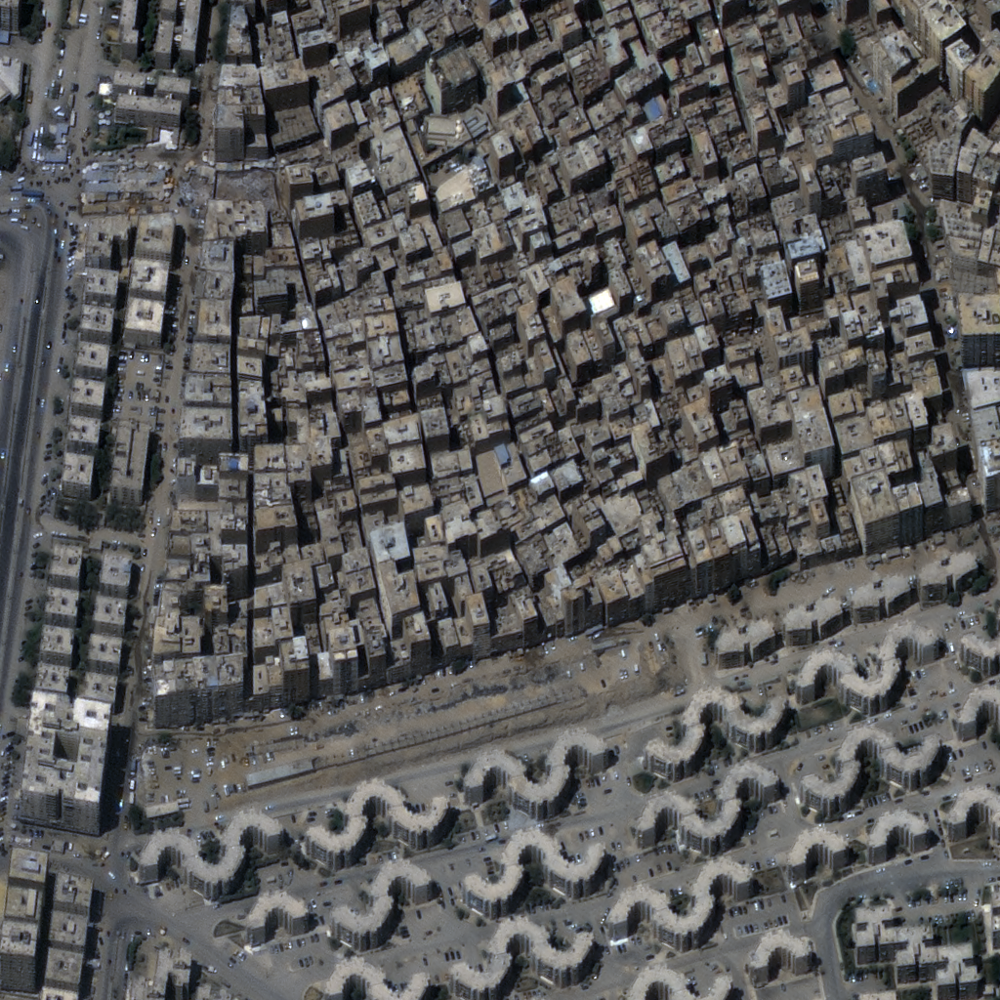

In [ ]:
Image('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/BLD01019_PS3_K3A_NIA0277.png')

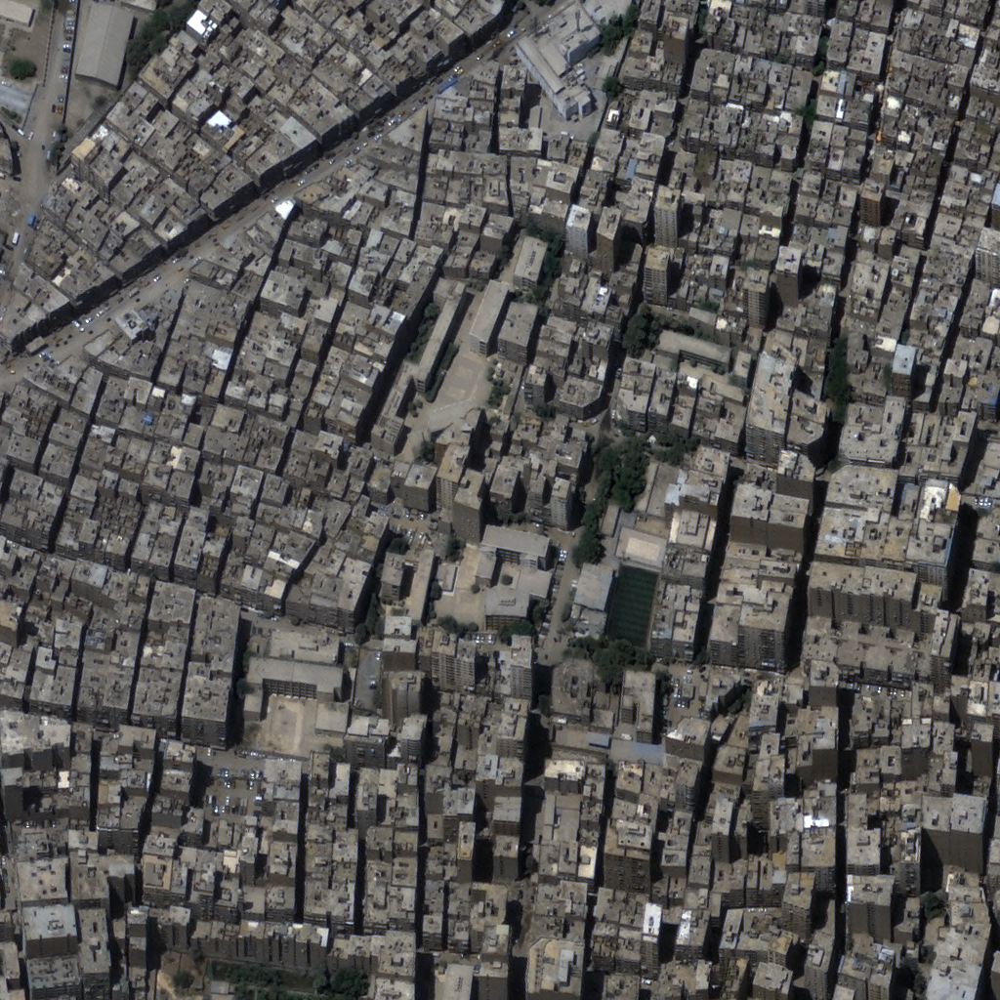

In [ ]:
Image('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/BLD00654_PS3_K3A_NIA0277.png')

In [ ]:
df_img2road.tail(200)

,road_count,road_nunique,Residential,Unclassified,Tertiary,Mortorway,Secondary,Primary
BLD00139_PS3_K3A_NIA0276.png,3,1,0,3,0,0,0,0
BLD02921_PS3_K3A_NIA0375.png,3,2,0,2,0,0,1,0
BLD02924_PS3_K3A_NIA0375.png,3,2,1,2,0,0,0,0
BLD03305_PS3_K3A_NIA0376.png,3,2,0,2,1,0,0,0
BLD03467_PS3_K3A_NIA0376.png,3,2,1,2,0,0,0,0
...,...,...,...,...,...,...,...,...
BLD00565_PS3_K3A_NIA0276.png,1,1,0,1,0,0,0,0
BLD00564_PS3_K3A_NIA0276.png,1,1,0,1,0,0,0,0
BLD00554_PS3_K3A_NIA0276.png,1,1,0,1,0,0,0,0
BLD02758_PS3_K3A_NIA0375.png,1,1,0,0,0,0,1,0


In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Histogram(x=df_img2road['road_count'], nbinsx=150)])
fig.update_traces(marker=dict(color='cornsilk', line=dict(color='#000000', width=1.5)))
fig.update_layout(title_text="Histogram of Road Counts",
                  xaxis_title_text='road count', # xaxis label
                  yaxis_title_text='image count')
fig.show()

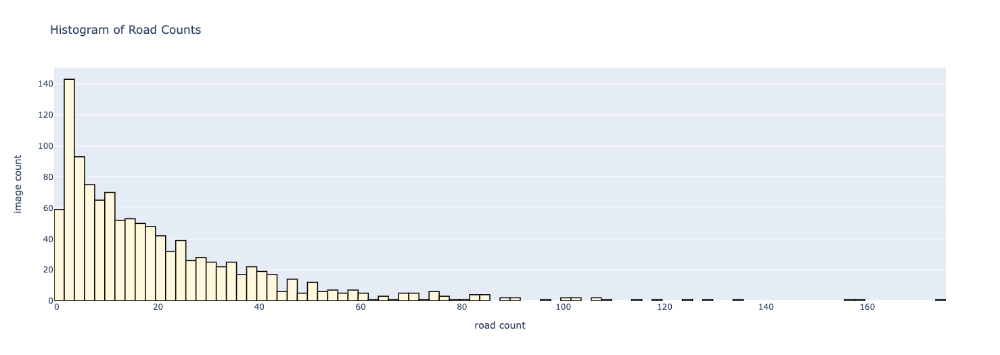

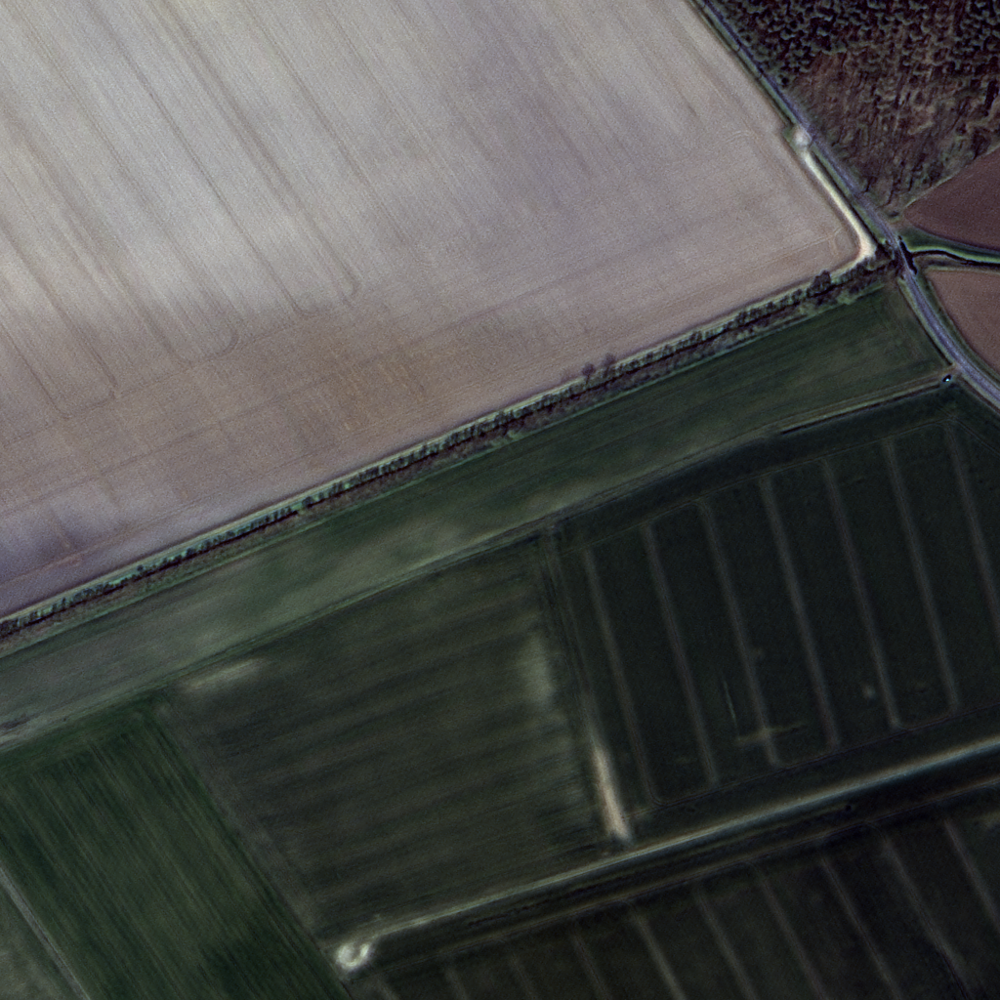

In [ ]:
from IPython.display import Image
Image('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/BLD02758_PS3_K3A_NIA0375.png')

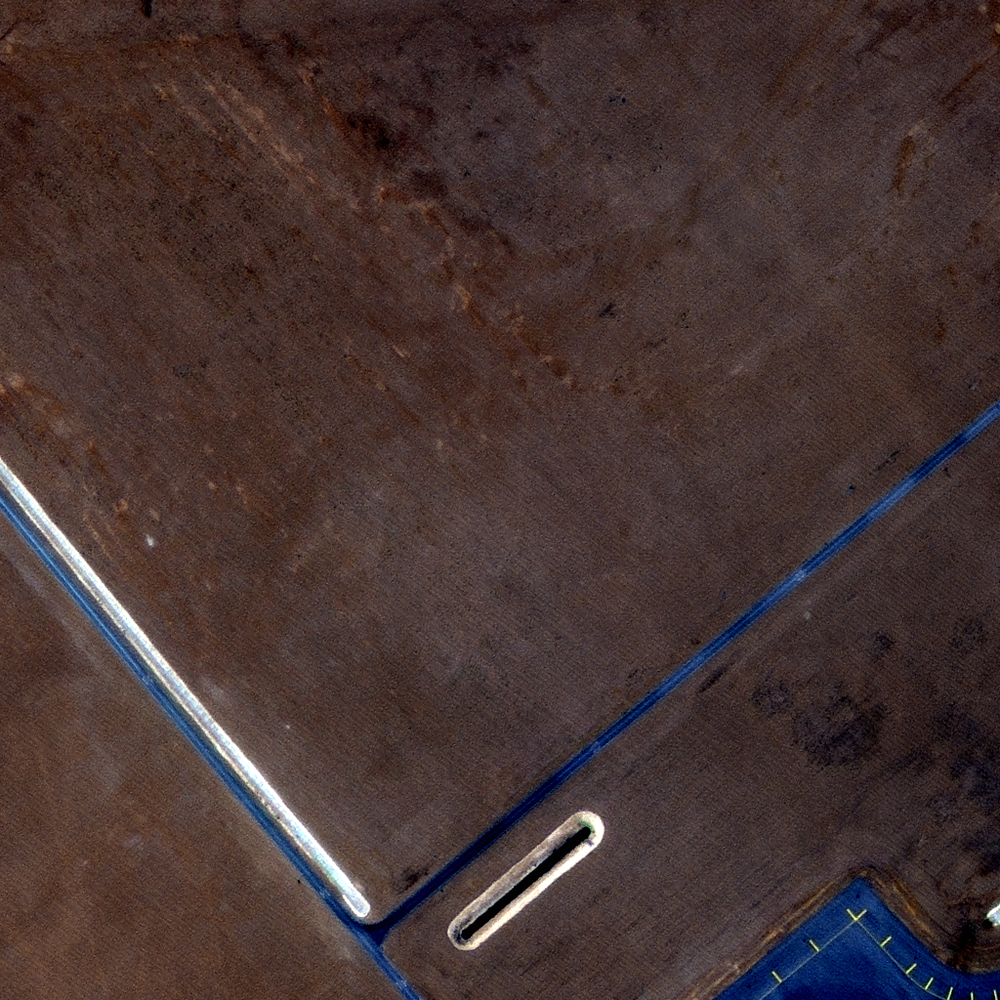

In [ ]:
Image('/content/drive/MyDrive/SharedData/sia-satellite-data/Training/train_roads_data/BLD00798_PS3_K3A_NIA0277.png')

In [ ]:
print('훈련셋 내에 총 road 개수:', total_df.sum().sum())
print('train set 내의 road 분포 비율')
a = total_df.sum().sort_values() / total_df.sum().sum()
b = ['Primary', 'Secondary', 'Mortorway', 'Tertiary', 'Unclassified', 'Residential']
a

훈련셋 내에 총 road 개수: 23384
train set 내의 road 분포 비율


Primary         0.036521
Secondary       0.036863
Mortorway       0.039856
Tertiary        0.074538
Unclassified    0.301830
Residential     0.510392
dtype: float64

- 절반이 residential 
- 그 다음 30 % 가 unclassified 
- building data 의 70% 가 아파트이기 때문에 비슷한 양상으로 데이터 불균형

In [ ]:
df_a = pd.DataFrame(a, columns=['ratio'])
df_a

,ratio
Primary,0.036521
Secondary,0.036863
Mortorway,0.039856
Tertiary,0.074538
Unclassified,0.301830
Residential,0.510392


In [ ]:
colors = ['linen', 'gold', 'lightcoral', 'lightpink', 'saddlebrown', 'cornsilk']
fig = go.Figure(data=[go.Bar(x=b,
                             y=a)])
fig.update_traces(textfont_size=13, 
                  marker=dict(color=colors, line=dict(color='#000000', width=1.5)))
fig.update_layout(title_text="Percentage of Roads Per Class(%)",
                  xaxis_title_text='class', # xaxis label
                  yaxis_title_text='ratio')
fig.show()

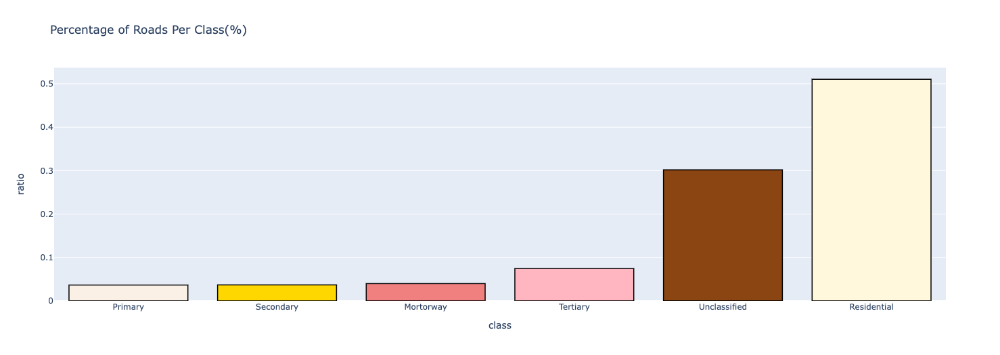

In [ ]:
fig = go.Figure(data=[go.Pie(labels=b,
                             values=a)])
fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=13, 
                  marker=dict(colors=colors, line=dict(color='#000000', width=1.5)))

fig.update_layout(title_text="Pieplot of Ratio Per Class(%)")
fig.show()

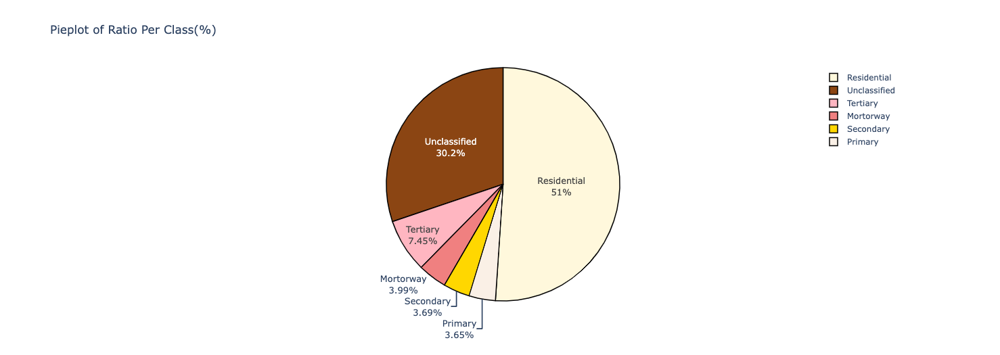

### Training Image들의 객체 분포
* y축 : Image 1144장을 포함된 도로의 빈도 순으로 정렬
* x축 : 빈도가 높은 도로 유형 순으로 정렬

<br></br>
#### Sparse & Imbalanced => Data Augmentation이 중요한 상황 

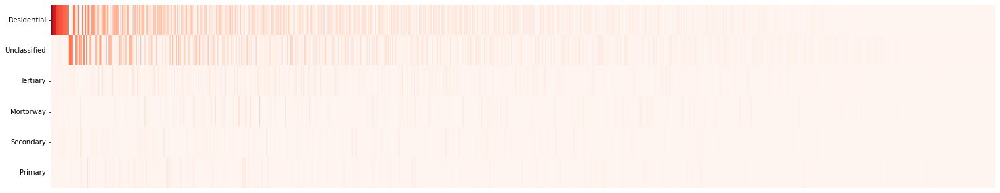

In [ ]:
plt.figure(figsize = (25,5))
ax = sns.heatmap(df_img2road.iloc[:,2:].transpose(), cmap='Reds', cbar=False, xticklabels=False)

### Buidings per single Image
* 사진1장에 포함된 객체수의 분포

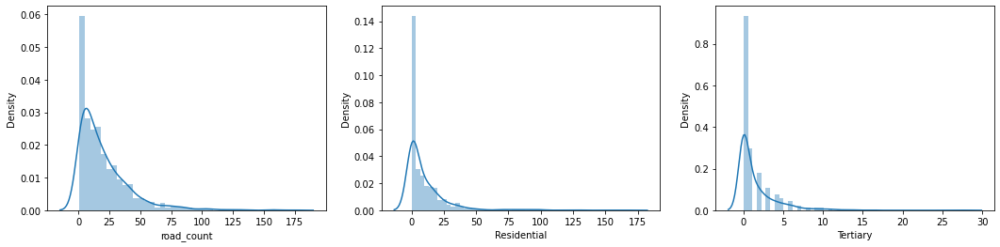

In [ ]:
fig, axs = plt.subplots(1,3, figsize = (18,4))
sns.distplot(df_img2road['road_count'], ax=axs[0])
sns.distplot(df_img2road['Residential'], ax=axs[1])
sns.distplot(df_img2road['Tertiary'], ax=axs[2])
plt.show()

### Image에 포함된 고유한 도로 유형수 1~6
* 한 이미지당 포함하는 type의 수 분포?

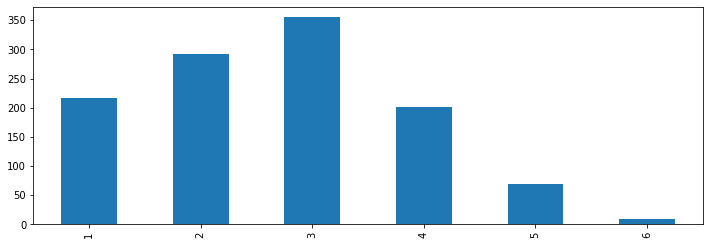

In [ ]:
df_img2road['road_nunique'].value_counts().sort_index().plot.bar(figsize=(12,4))
plt.show()

## 빌딩 유형별 전체 도로수(road_count), 도로를 포함하는 이미지수(image_count)

In [ ]:
df_road = df_train.type_name.value_counts().to_frame(name = 'road_count')
df_road = df_road.join(df_train[['type_name','image_id']].drop_duplicates()['type_name'].value_counts()).rename(columns = {'type_name':'image_count'})
#df_object.plot.barh(figsize=(12,6))

In [ ]:
df_road

,road_count,image_count
Residential,11935,741
Unclassified,7058,844
Tertiary,1743,545
Mortorway,932,242
Secondary,862,374
Primary,854,333


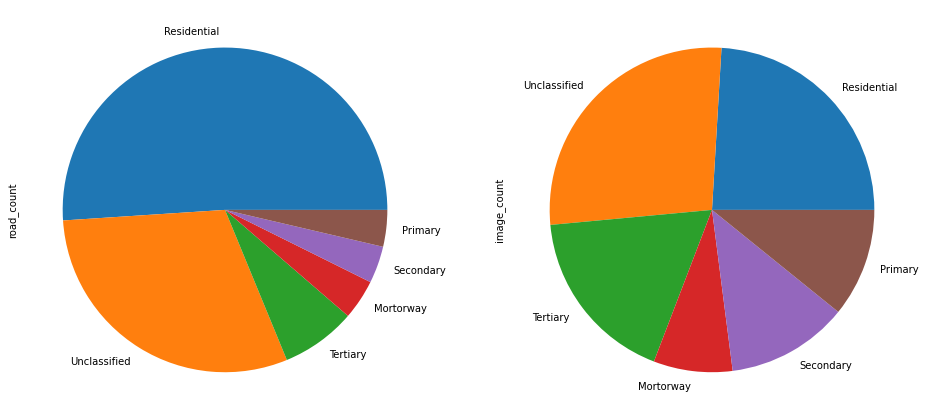

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
df_road['road_count'].plot.pie(ax=axs[0])
df_road['image_count'].plot.pie(ax=axs[1])

In [ ]:
print(df_train.dtypes)

image_id                 object
type_id                   int64
geo_coord                object
type_name                object
road_imcoords            object
ingest_time      datetime64[ns]
ingest_date      datetime64[ns]
dtype: object


## ingest_time을 활용한 date 분포 확인

In [ ]:
df_date = df_train[['ingest_time', 'ingest_date']]
print(df_date)

              ingest_time ingest_date
0     2020-11-05 06:40:40  2020-11-05
1     2020-11-05 06:40:40  2020-11-05
2     2020-11-05 06:40:40  2020-11-05
3     2020-11-05 06:40:40  2020-11-05
4     2020-11-05 06:40:40  2020-11-05
...                   ...         ...
23379 2020-10-27 02:05:22  2020-10-27
23380 2020-10-27 02:05:22  2020-10-27
23381 2020-10-27 02:05:22  2020-10-27
23382 2020-10-27 02:05:22  2020-10-27
23383 2020-10-27 02:05:22  2020-10-27

[23384 rows x 2 columns]


In [ ]:
df_date['ingest_time'].value_counts()

2020-10-27 02:05:22    10856
2020-11-25 01:45:39     1332
2020-11-18 05:14:02      961
2020-11-20 02:39:29      668
2020-11-18 05:12:08      308
                       ...  
2020-10-19 08:37:46        1
2020-10-22 07:53:58        1
2020-11-24 08:40:27        1
2020-10-16 08:45:53        1
2020-10-19 08:50:35        1
Name: ingest_time, Length: 413, dtype: int64

In [ ]:
# 날짜는 2020-08-12부터 2020-11-25까지
df_date.sort_values('ingest_date')

,ingest_time,ingest_date
2710,2020-08-25 03:30:37,2020-08-25
2723,2020-08-25 03:30:37,2020-08-25
2724,2020-08-25 03:30:37,2020-08-25
2725,2020-08-25 03:30:37,2020-08-25
2726,2020-08-25 03:30:37,2020-08-25
...,...,...
6138,2020-11-25 01:45:39,2020-11-25
6137,2020-11-25 01:45:39,2020-11-25
6136,2020-11-25 01:45:39,2020-11-25
6149,2020-11-25 01:45:39,2020-11-25


In [ ]:
# 2020-08-12 09:12:03부터 2020-11-25 08:58:01까지
df_date.sort_values('ingest_time', inplace=True)
print(df_date['ingest_time'].head())
print(df_date['ingest_time'].tail())

2696   2020-08-25 03:30:37
2714   2020-08-25 03:30:37
2715   2020-08-25 03:30:37
2717   2020-08-25 03:30:37
2718   2020-08-25 03:30:37
Name: ingest_time, dtype: datetime64[ns]
625   2020-11-25 08:59:32
627   2020-11-25 08:59:32
628   2020-11-25 08:59:32
620   2020-11-25 08:59:32
626   2020-11-25 08:59:32
Name: ingest_time, dtype: datetime64[ns]


In [ ]:
df_date['ingest_time'].value_counts()

2020-10-27 02:05:22    10856
2020-11-25 01:45:39     1332
2020-11-18 05:14:02      961
2020-11-20 02:39:29      668
2020-11-18 05:12:08      308
                       ...  
2020-11-20 06:26:46        1
2020-10-19 08:50:35        1
2020-10-19 08:37:46        1
2020-10-16 08:45:53        1
2020-11-17 06:49:08        1
Name: ingest_time, Length: 413, dtype: int64

In [ ]:
df_date['year'] = df_date['ingest_time'].dt.year
df_date['month'] = df_date['ingest_time'].dt.month
df_date['week'] = df_date['ingest_time'].dt.week
df_date['day'] = df_date['ingest_time'].dt.weekday

In [ ]:
print(df_date)

             ingest_time ingest_date  year  month  week  day
2696 2020-08-25 03:30:37  2020-08-25  2020      8    35    1
2714 2020-08-25 03:30:37  2020-08-25  2020      8    35    1
2715 2020-08-25 03:30:37  2020-08-25  2020      8    35    1
2717 2020-08-25 03:30:37  2020-08-25  2020      8    35    1
2718 2020-08-25 03:30:37  2020-08-25  2020      8    35    1
...                  ...         ...   ...    ...   ...  ...
625  2020-11-25 08:59:32  2020-11-25  2020     11    48    2
627  2020-11-25 08:59:32  2020-11-25  2020     11    48    2
628  2020-11-25 08:59:32  2020-11-25  2020     11    48    2
620  2020-11-25 08:59:32  2020-11-25  2020     11    48    2
626  2020-11-25 08:59:32  2020-11-25  2020     11    48    2

[23384 rows x 6 columns]


In [ ]:
df_date['ingest_hour'] = df_date['ingest_time'].dt.hour
df_train['ingest_hour'] = df_date['ingest_hour']
df_date['ingest_hour']

2696    3
2714    3
2715    3
2717    3
2718    3
       ..
625     8
627     8
628     8
620     8
626     8
Name: ingest_hour, Length: 23384, dtype: int64

In [ ]:
# 시간대는 00-08시까지
df_date['ingest_hour'].value_counts()

2    12451
5     3033
1     2207
6     1849
7     1227
8     1178
4      732
3      468
0      239
Name: ingest_hour, dtype: int64

In [ ]:
len_df = len(df_date['ingest_hour'])
len_df

23384

In [ ]:
ratio = []
for i in range(0,9):
  ratio.append(df_date['ingest_hour'].value_counts()[i] / len_df)
print(ratio)
print(sum(ratio))

[0.01022066370167636, 0.09438077317824153, 0.5324580910023948, 0.020013684570646596, 0.031303455354088267, 0.12970407115976737, 0.0790711597673623, 0.0524717755730414, 0.05037632569278139]
1.0


In [ ]:
colors = ['rosybrown', 'linen', 'peachpuff', 'lightcoral', 'lightpink', 'peru', 'cornsilk', 'ivory','honeydew']
labels = [0, 1, 2, 3, 4, 5, 6 ,7, 8]
fig = go.Figure(data=[go.Pie(labels=labels,
                             values=ratio)])
fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=13, 
                  marker=dict(colors=colors, line=dict(color='#000000', width=1.5)))

fig.update_layout(title_text="Ratio of Ingest Hour(%)")
fig.show()

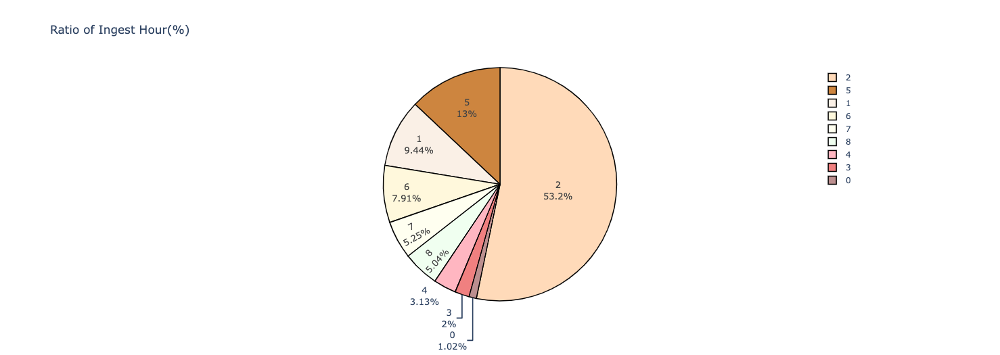

In [ ]:
temp= df_train.groupby(['ingest_hour'])['type_name'].count().to_frame()
fig = go.Figure(data=go.Scatter(y=temp['type_name']))
fig.update_traces(marker=dict(color='dimgray'))
fig.update_layout(title_text="Count of Ingest Hour(%)",
                  xaxis_title_text='hour', # xaxis label
                  yaxis_title_text='count')
fig.show()

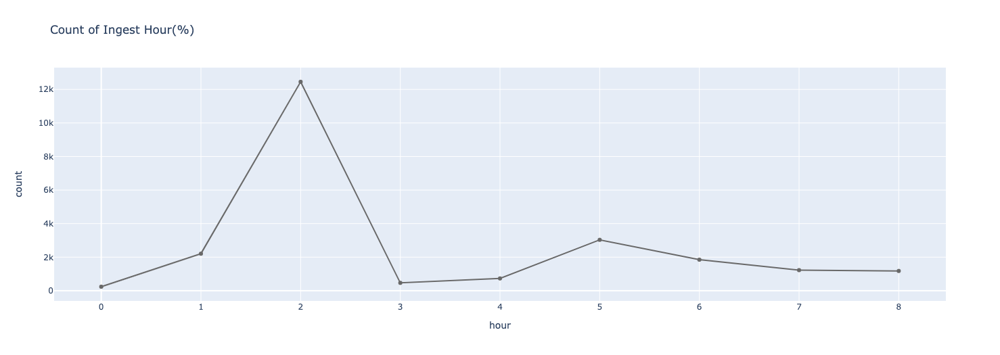

In [ ]:
df_date['day'].value_counts()

1    12998
2     5464
4     2530
3     1469
0      923
Name: day, dtype: int64

In [ ]:
ratio = []
for i in range(0,5):
  ratio.append(df_date['day'].value_counts()[i] / len_df)
print(ratio)
print(sum(ratio))

[0.03947143345877523, 0.5558501539514198, 0.23366404379062608, 0.0628207321245296, 0.10819363667464933]
1.0000000000000002


In [ ]:
colors = ['rosybrown', 'linen', 'peachpuff', 'lightcoral', 'lightpink', 'peru', 'cornsilk', 'ivory', 'sandybrown', 'honeydew']
labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri']
fig = go.Figure(data=[go.Pie(labels=labels,
                             values=ratio)])
fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=13, 
                  marker=dict(colors=colors, line=dict(color='#000000', width=1.5)))

fig.update_layout(title_text="Ratio of Day(%)")
fig.show()

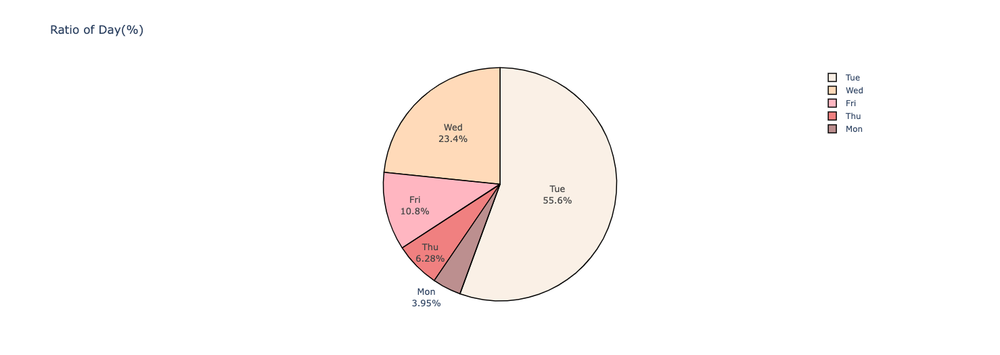

In [ ]:
df_train['day'] = df_date['day']
temp = df_train.groupby(['day'])['type_name'].count().to_frame()
labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri']

fig = go.Figure(data=go.Scatter(x=labels, y=temp['type_name']))
fig.update_traces(marker=dict(color='dimgray'))
fig.update_layout(title_text="Count of Day(%)",
                  xaxis_title_text='day', # xaxis label
                  yaxis_title_text='count')
fig.show()

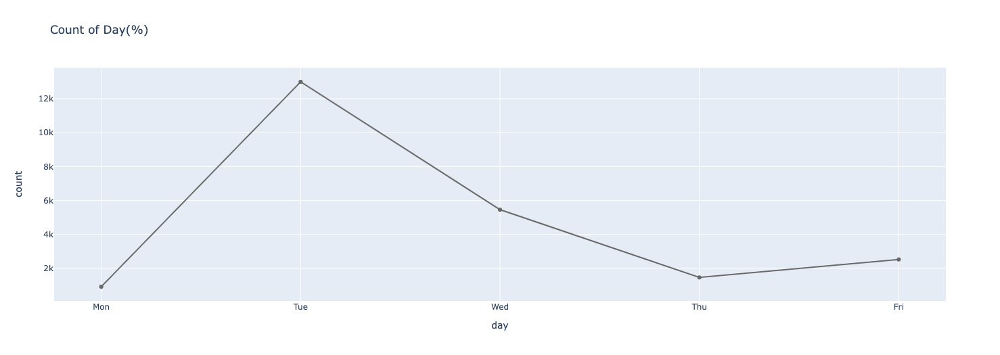